In [1]:
import os
import cv2
import torch
import pandas as pd
import numpy as np

from torch import nn

from tqdm.notebook import tqdm
from collections import defaultdict
from torch.utils.data import Dataset, DataLoader
from transformers import get_scheduler

import matplotlib.pyplot as plt
%matplotlib inline

2023-05-31 21:50:27.740198: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-31 21:50:33.997710: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
from loss import dice_coef_loss, tversky_index_loss, TverskyIndexLoss
from ImageDataset import ImageDataset, get_img_for_train_and_val, collate_fn
from imgPrepare import img_prepare, create_img_transform
from smallModel import SmallSegFormer
from wideSegFormer import WideSegFormer
from learning_loop import learning_loop, show_examples
from train_model import create_model_and_optimizer, load_model_and_create_optimizer
%load_ext autoreload
%autoreload 2

In [3]:
def get_img_for_train_and_val(data_folder, p=0.9, seed=777, img_count=21000, img_count_test=400):
    train = []
    test = []
    np.random.seed(seed)
    for img_name in os.listdir(data_folder + "/color"):
            if np.random.rand() >= p:
                if len(test) < img_count_test:
                    test.append(img_name)
            else:
                if len(train) < img_count:
                    train.append(img_name)
    return train, test

In [4]:
img_size_for_model = 512
annotate = False
img_transform = create_img_transform(img_size_for_model, val=True, annotate = annotate)
train, test = get_img_for_train_and_val("data/RHD_published_v2/training/")

In [5]:
class HandDataset(Dataset):
    def __init__(self, img_names, transform):
        super(HandDataset, self).__init__()
        self.data = img_names
        self.transform = transform
        self.annotate = False

    def __getitem__(self, index):
        img_name = "data/RHD_published_v2/training/color/" + self.data[index] 
        mask_name = img_name.replace("color", "mask")
        img = cv2.imread(img_name)
        if img is None:
            print("none", img_name)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_name)
        mask = mask.sum(axis=2) > 3
        mask = torch.Tensor(mask).bool()
        output = img_transform({'image': img, 'mask': mask})
        return output["image"], output["mask"]

    def __len__(self):
        return len(self.data)

In [6]:
dataset_train = HandDataset(train, img_transform)
dataset_test = HandDataset(test, img_transform)

In [7]:
len(dataset_train), len(dataset_test)

(21000, 400)

In [8]:
batch_size = 4

dataloader_train = DataLoader(
    dataset=dataset_train,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=True,
    drop_last=True,
)

dataloader_val = DataLoader(
    dataset=dataset_test,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=False,
    drop_last=False,
)

In [9]:
def train(model, opt, loader, criterion):
    model.train()
    losses_tr = []
    for imgs_batch, mask_batch in tqdm(loader):
        optimizer.zero_grad()
        imgs_batch = imgs_batch.to(device)
        mask_batch = mask_batch.to(device)
        pred = model(imgs_batch)
        pred = nn.functional.sigmoid(pred.permute(0, 2, 3, 1))
        pred = pred.view(pred.shape[0], pred.shape[1], -1)
        loss = criterion(pred, mask_batch)
        loss.backward()
        optimizer.step()
        losses_tr.append(loss.item())
    
    return model, optimizer, np.mean(losses_tr)


def val(model, loader, criterion, metric_names=None):
    model.eval()
    losses_val = []
    if metric_names is not None:
        metrics = defaultdict(list)
    with torch.no_grad():
        for imgs_batch, mask_batch in tqdm(loader):
            imgs_batch = imgs_batch.to(device)
            mask_batch = mask_batch.to(device)
            pred = model(imgs_batch)
            pred = nn.functional.sigmoid(pred.permute(0, 2, 3, 1))
            pred = pred.view(pred.shape[0], pred.shape[1], -1)
            loss = criterion(pred, mask_batch)
            losses_val.append(loss.item())
            
            if metric_names is not None:
                if 'diceCoefficient' in metric_names:
                    metrics['diceCoefficient'].append(
                            dice_coef_loss((pred >= 0.5).long(), mask_batch, reverse=True).item()
                        )

        if metric_names is not None:
            for name in metrics:
                metrics[name] = np.mean(metrics[name])
    return np.mean(losses_val), metrics if metric_names else None

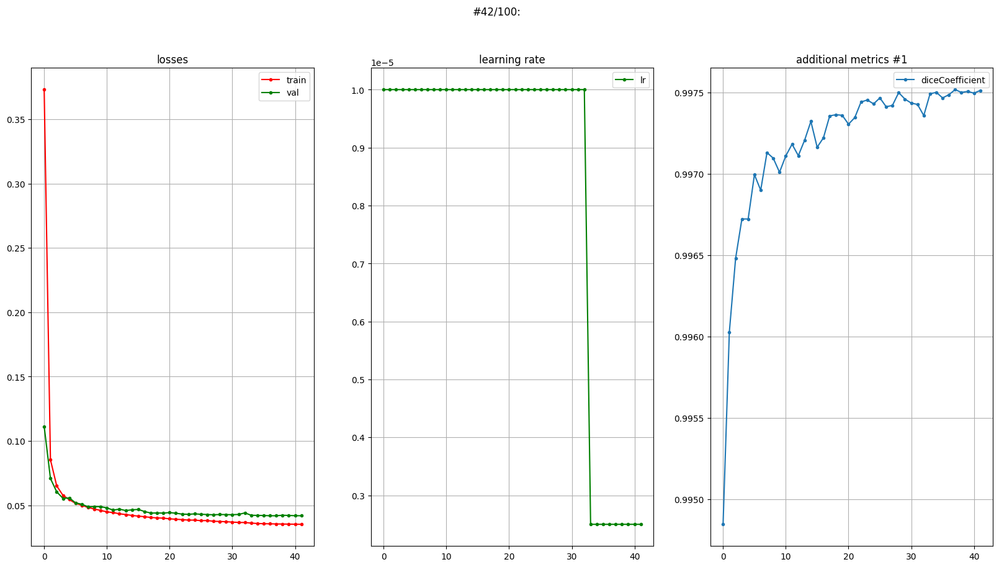

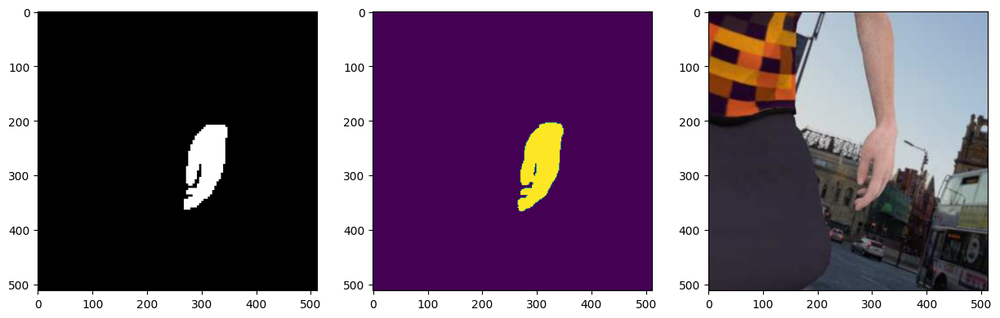

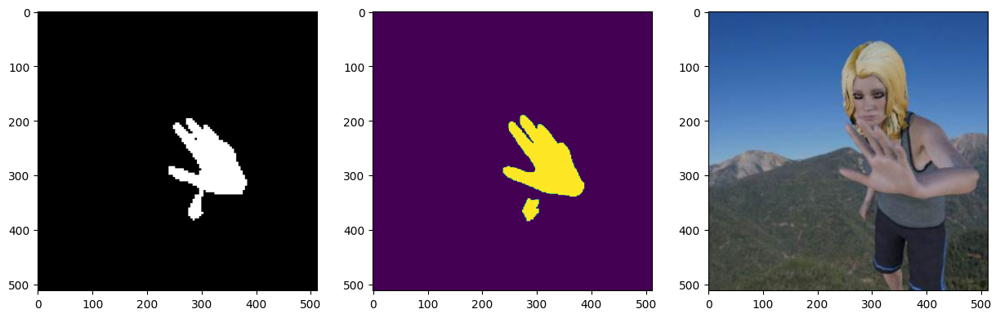

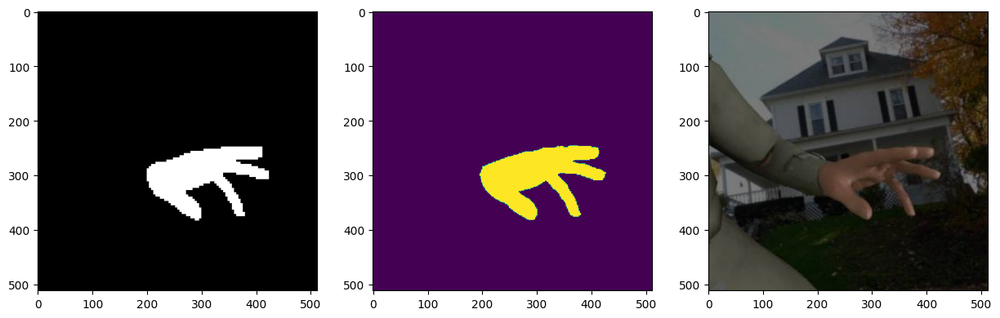

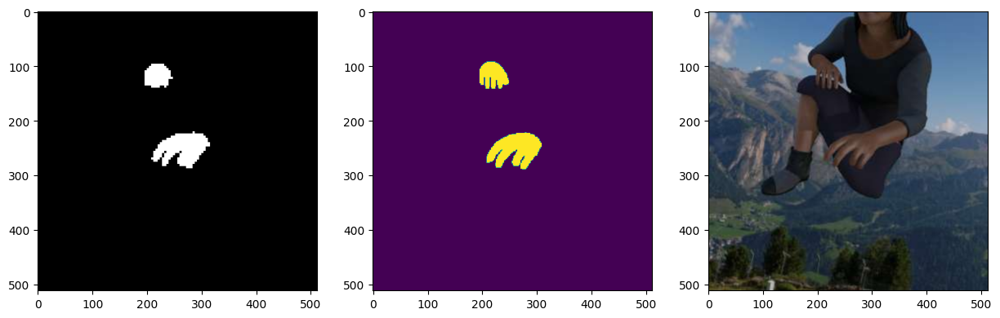

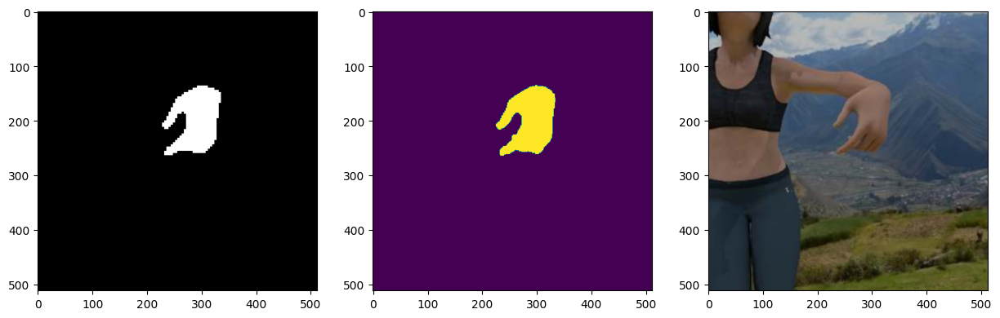

Learning process ended with early stop after epoch 42
CPU times: user 2d 21h 4min 5s, sys: 5h 59min 29s, total: 3d 3h 3min 34s
Wall time: 12h 51min 39s


In [10]:
%%time

device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
# device = torch.device('cpu')
model, optimizer = create_model_and_optimizer(
    model_class = SmallSegFormer,
    model_params = {
        "freeze_encoder": False, 
        "segFormerNumber": 2
    },
    device = device,
    lr=1e-5
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.25, patience=4, threshold=0.001, verbose=True)

a = 0.3
criterion = TverskyIndexLoss(a, 1 - a)
every = 1
model, optimizer, losses = learning_loop(
    train,
    val,
    model = model,
    optimizer = optimizer,
    train_loader = dataloader_train,
    val_loader = dataloader_val,
    criterion = criterion,
    scheduler = scheduler,
    epochs = 100,
    min_lr = 1e-6,
    val_every = every,
    draw_every = every,
    separate_show = False,
    metric_names = {
        "diceCoefficient": {"plot_id": 1},
    },
    chkp_folder = "./chkp",
    model_name = "handModel3",
    test_dataset = dataset_test
)

In [ ]:
img_name = "data/X/0_X.jpg"

In [11]:
chkp_folder = "./chkp"
epoch = 42
model_name = "handModel3"
torch.save(
                    {
                        'epoch': epoch,
                        'model_state_dict': model.state_dict(),
                        'optimizer_state_dict': optimizer.state_dict(),
                        'scheduler_state_dict': scheduler.state_dict(),
                        'losses': losses,
                    },
                    os.path.join(chkp_folder, model_name, f'{model_name}#{epoch}.pt'),
                )

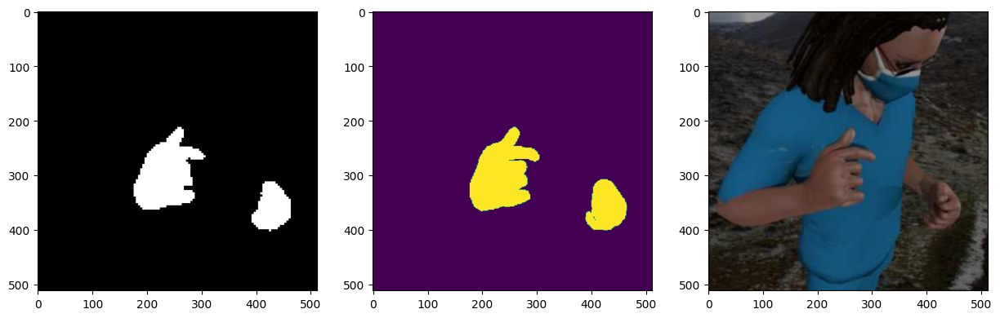

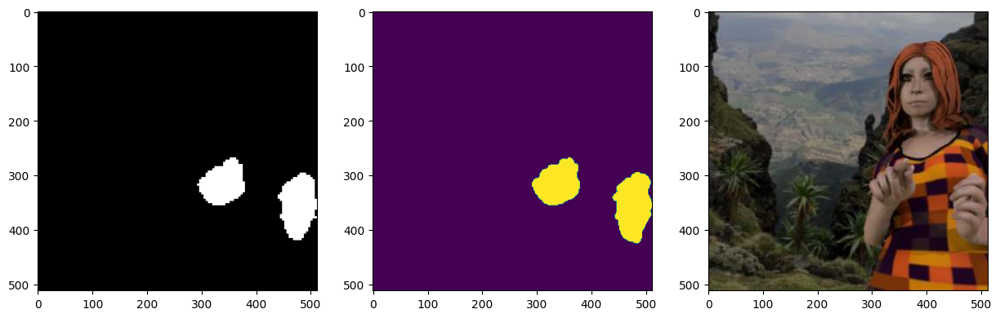

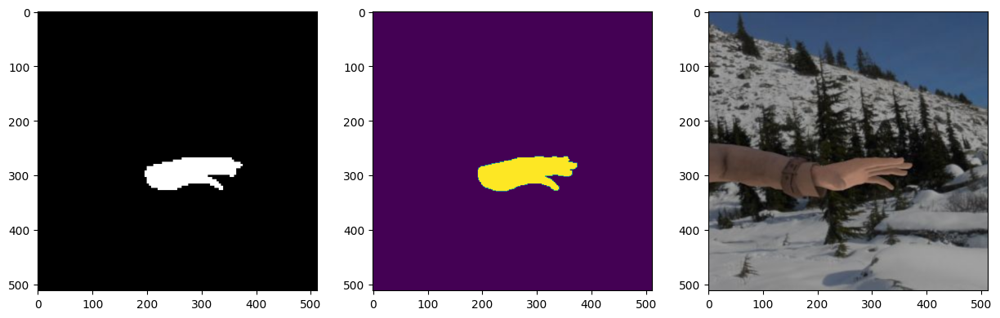

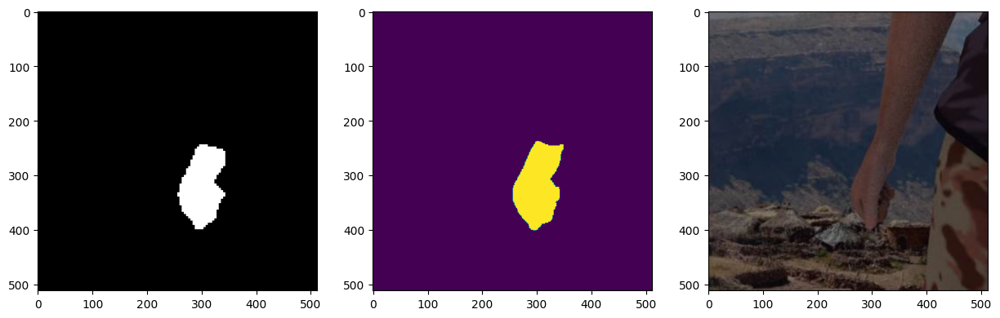

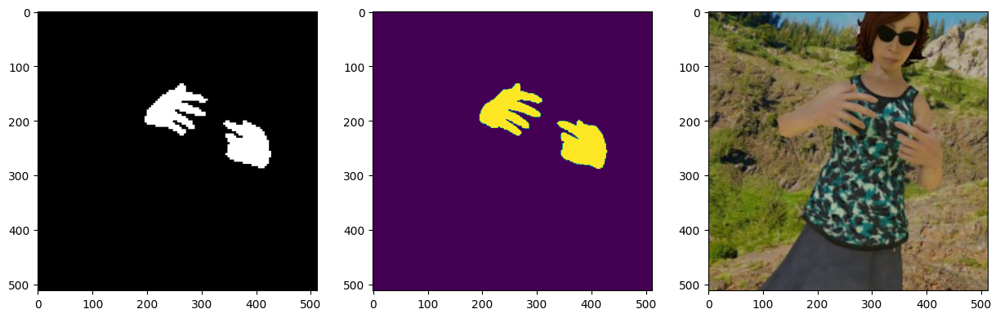

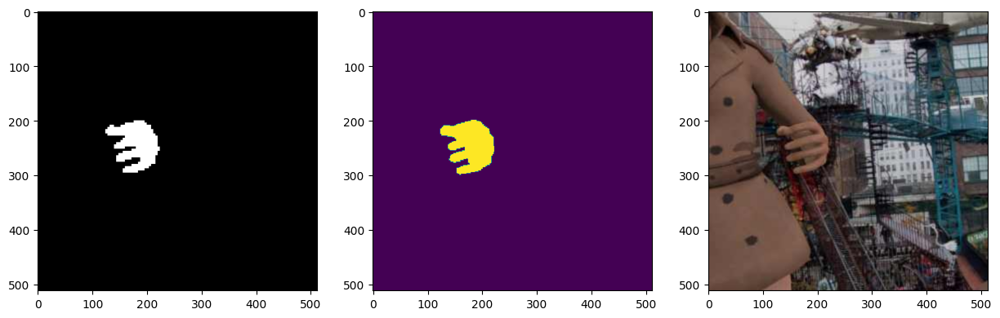

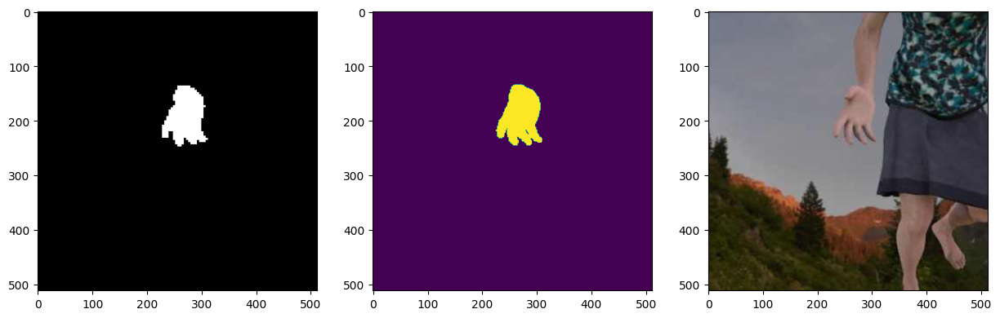

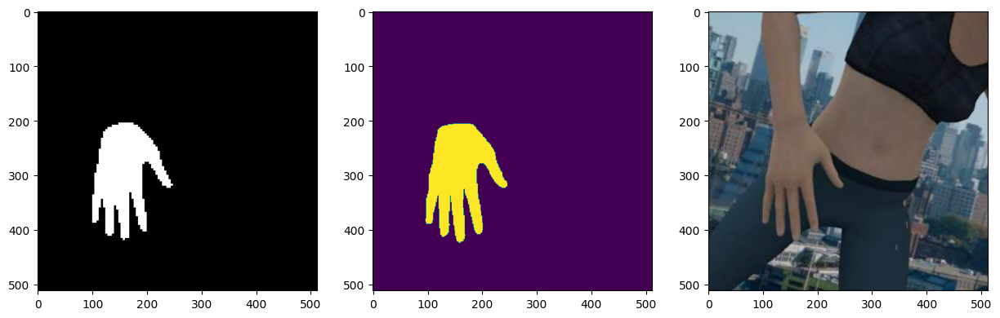

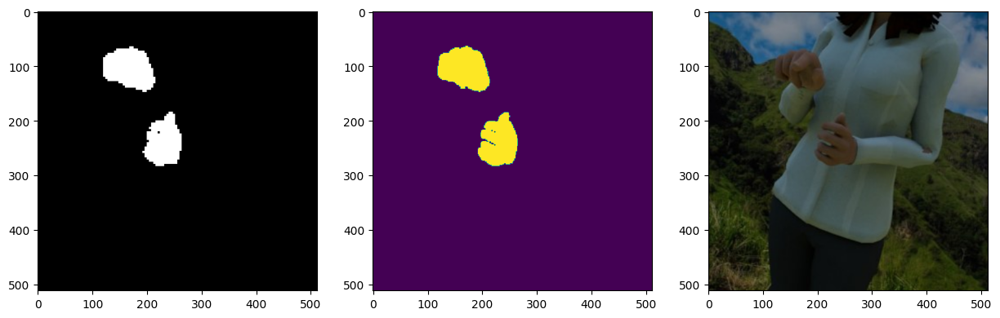

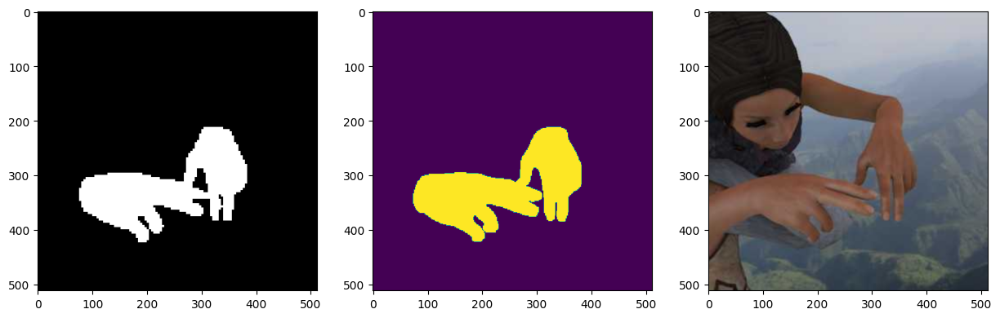

In [12]:
show_examples(10, dataset_test, model)

In [ ]:
for 

In [44]:
img_name = "10_X.jpg"
# mask_name = img
# x, y = 

In [13]:
def show_random_img(data_folder, count, p=0.3):
    i = 0
    for img_name in os.listdir(data_folder + "/X"):
        if os.path.isfile(data_folder + "/Y/" + img_name.replace("X", "Y")):
            if np.random.rand() >= p:
                if i > count:
                    return
                show_img(img_name)
                i += 1

In [14]:
def show_img(img_name):
    x, y = img_prepare(img_name, img_transform)
    outputs = model(x[None].float().cuda())
    pred = outputs.cpu() 
    pred = nn.functional.sigmoid(pred.permute(0, 2, 3, 1))
    pred = pred.view(pred.shape[0], pred.shape[1], -1)
    res = (pred >= 0.5).float()
    res_for_plt = res.repeat_interleave(4, dim=2).repeat_interleave(4, dim=1).repeat(3, 1, 1).numpy().transpose((1, 2, 0)).astype('float32')
    fig, axs = plt.subplots(nrows= 1 , ncols= 3, figsize=(15, 15))
    axs[0].imshow(res_for_plt)
    axs[1].imshow(y.numpy())
    axs[2].imshow(x.numpy().transpose(1, 2, 0))
    plt.show()

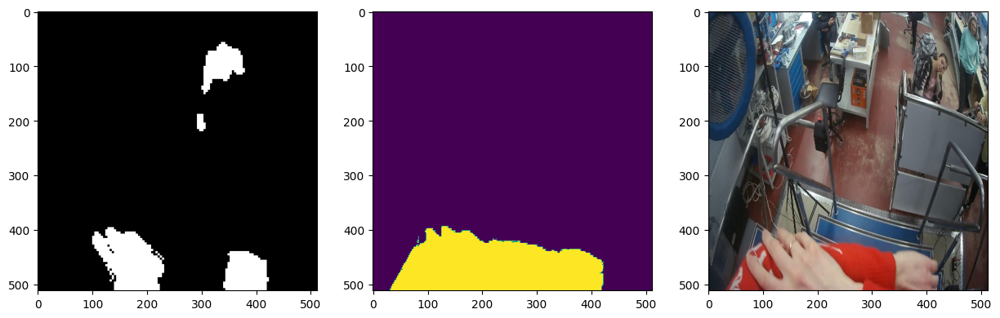

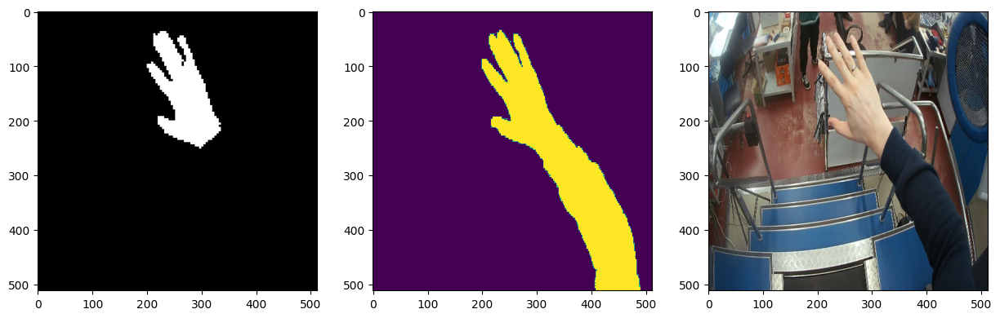

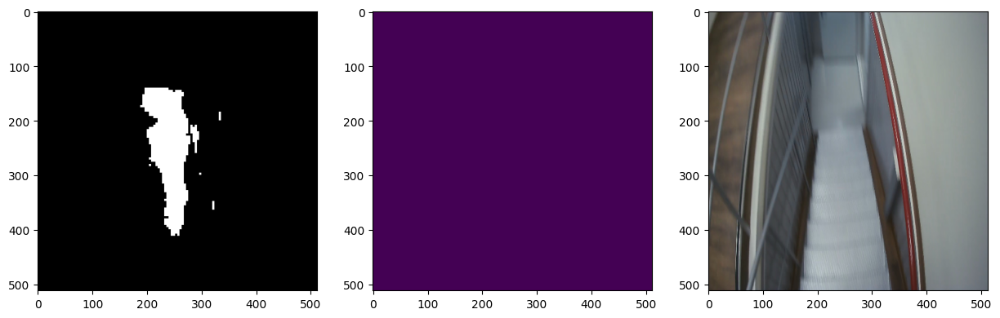

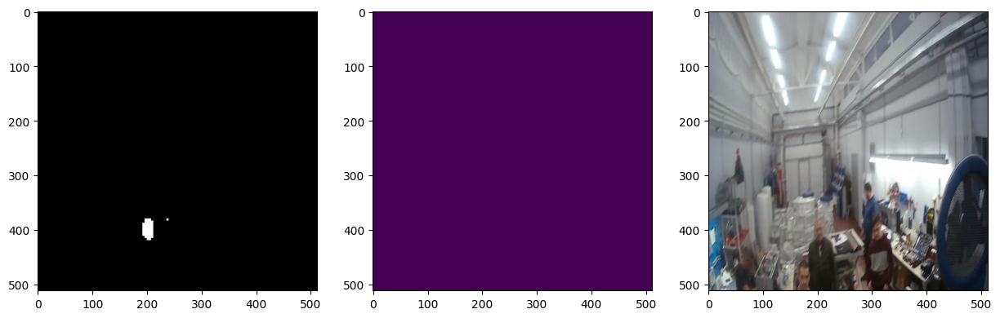

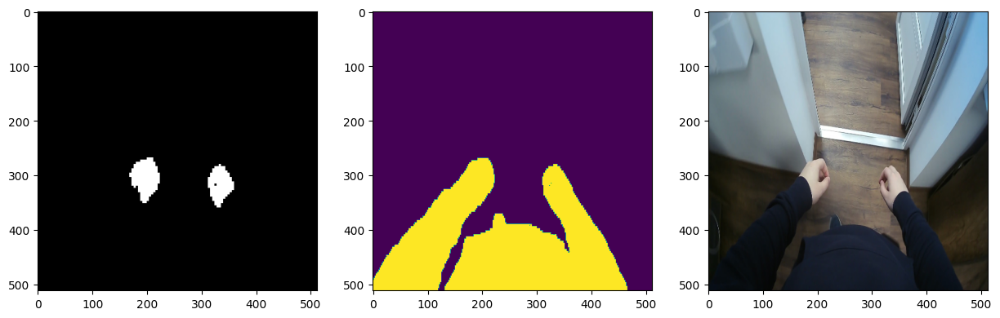

...

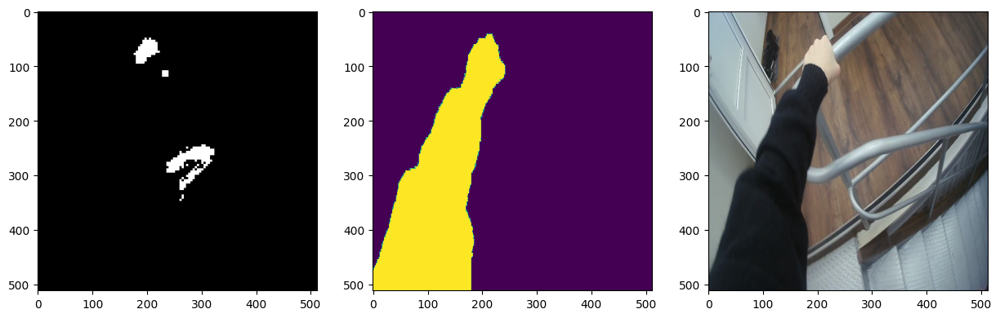

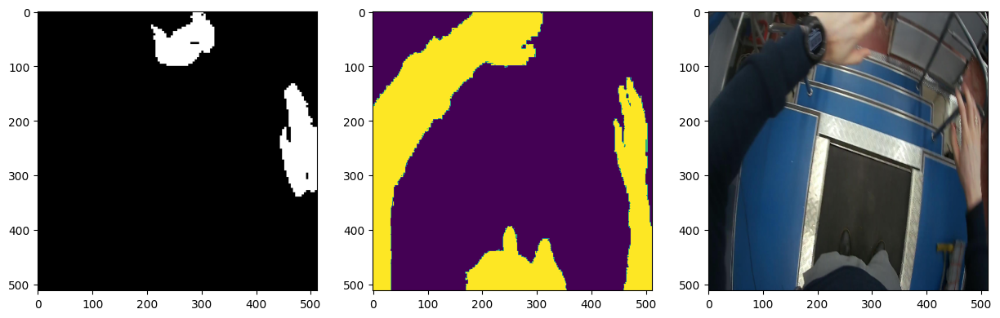

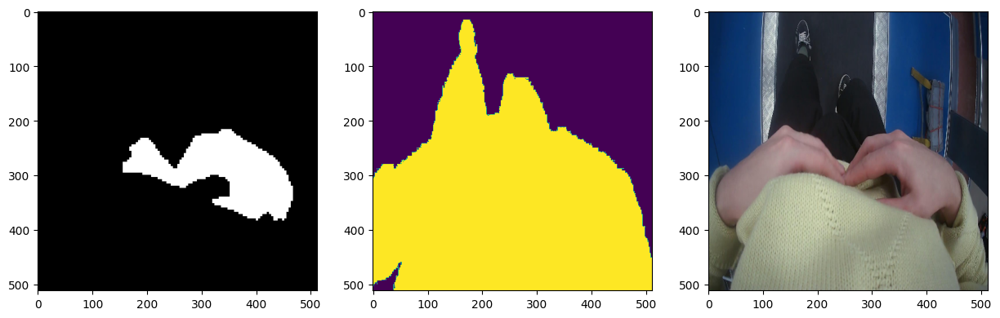

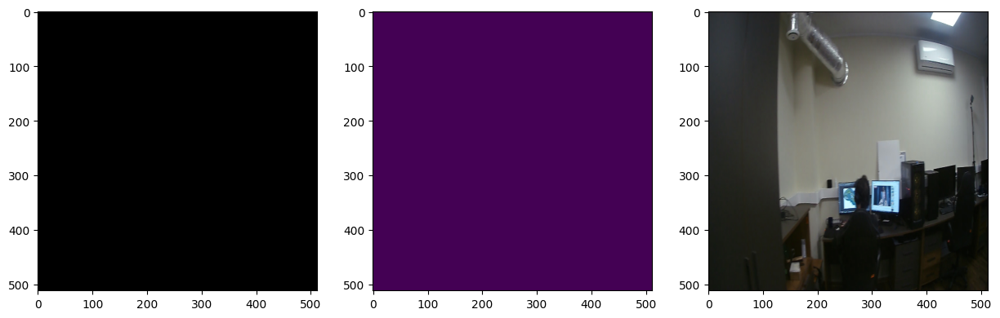

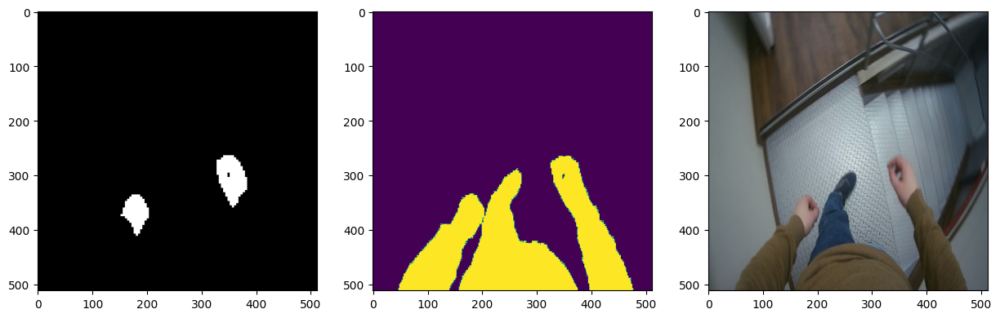

In [15]:
show_random_img("data", 10)

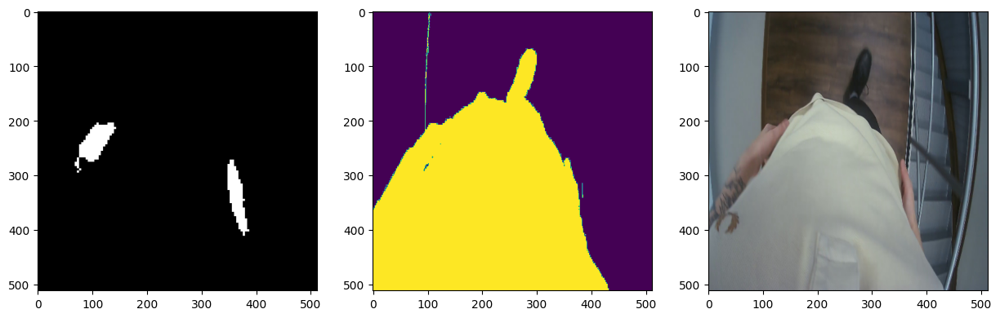

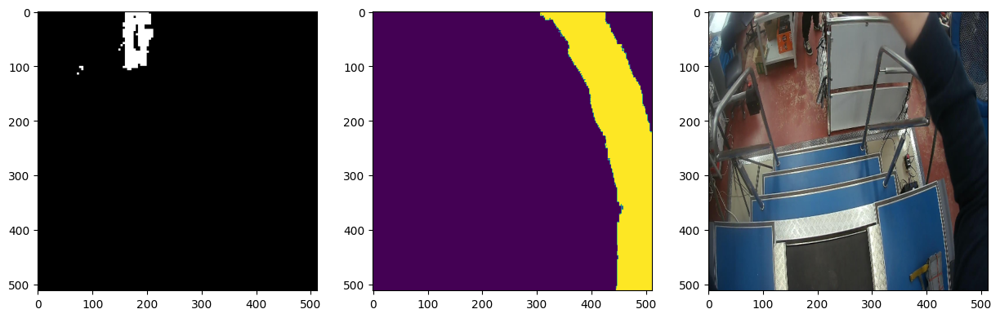

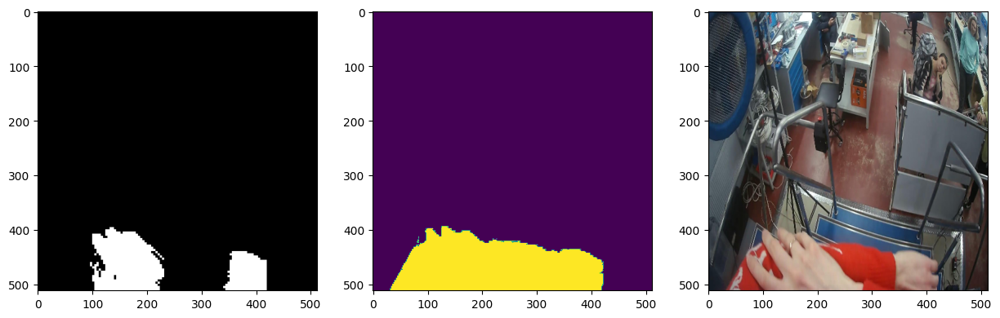

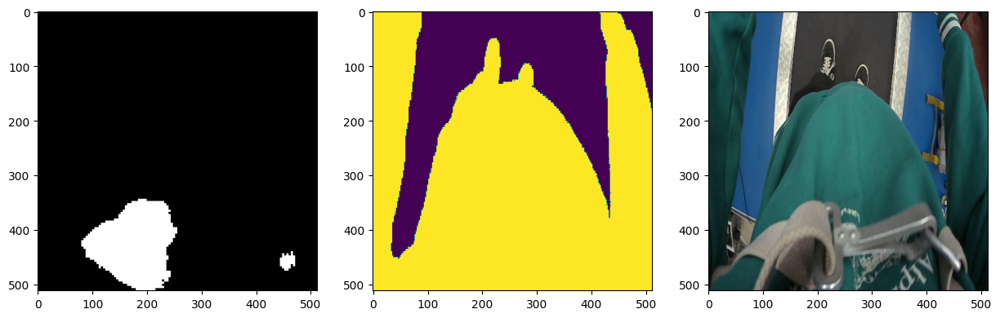

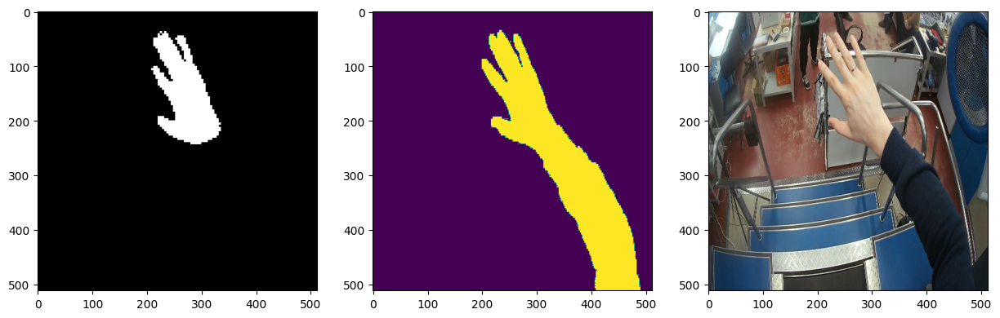

...

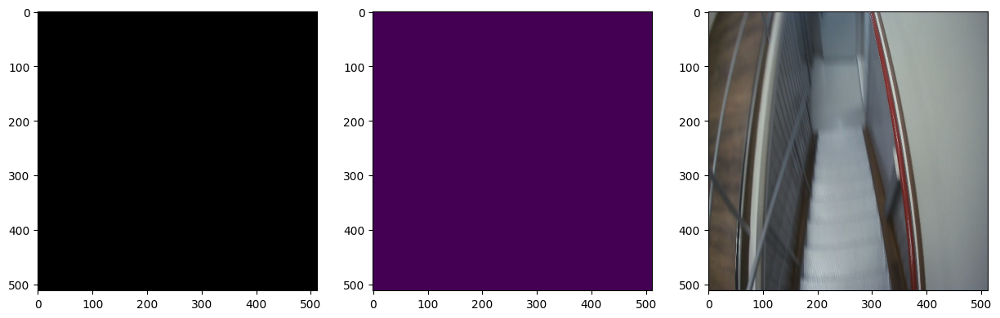

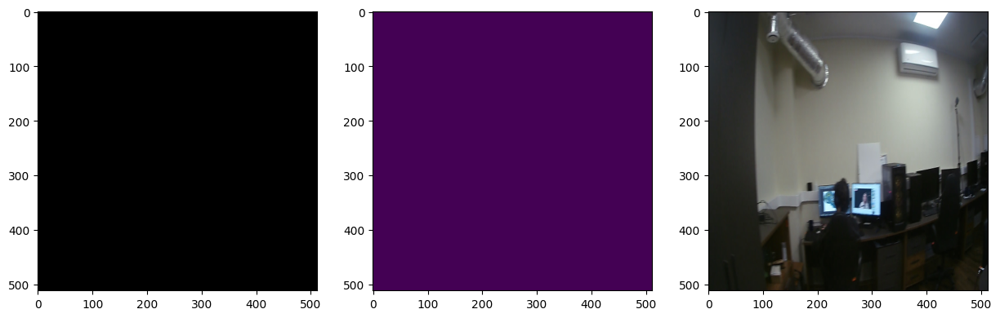

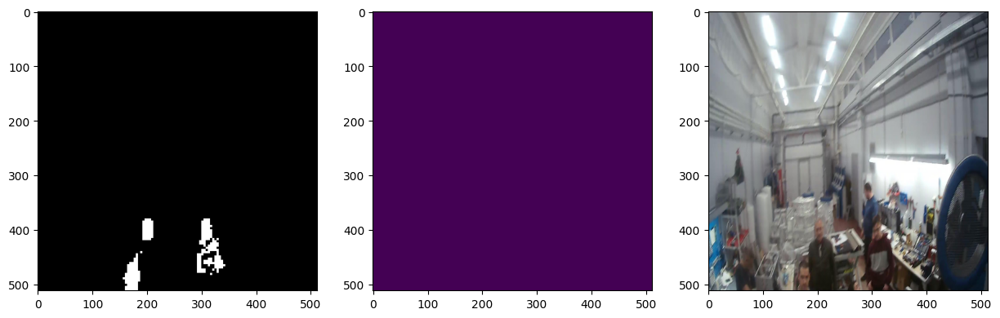

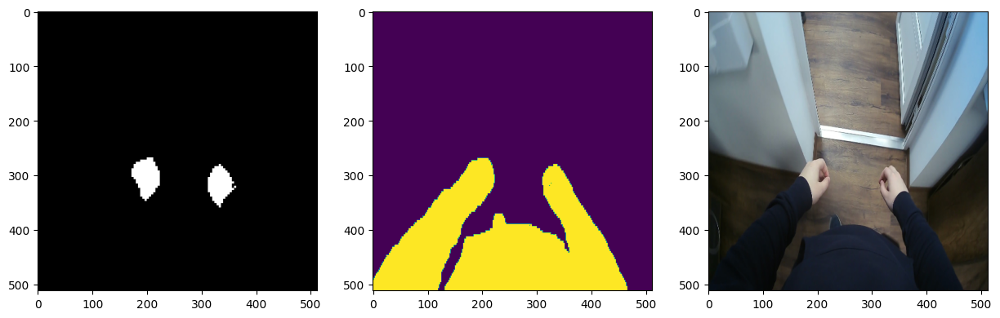

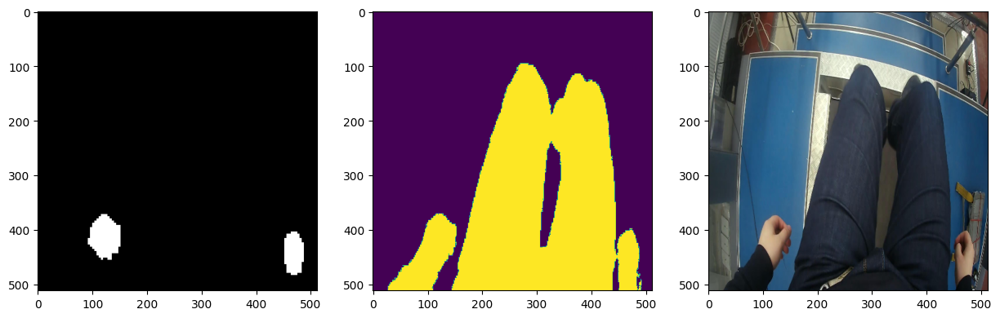

In [14]:
show_random_img("data", 10, p=0.05)

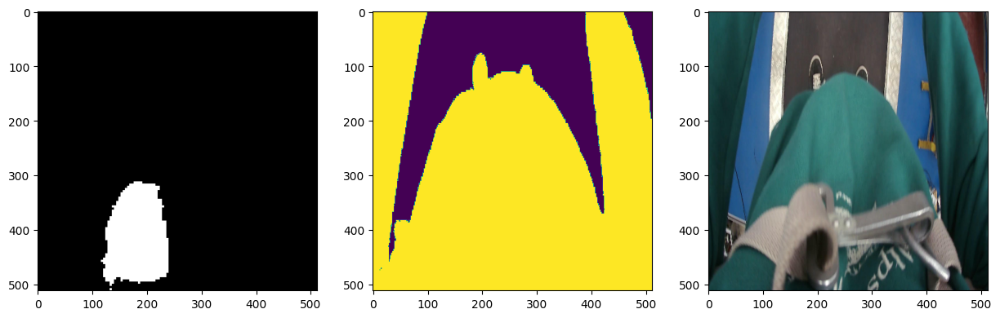

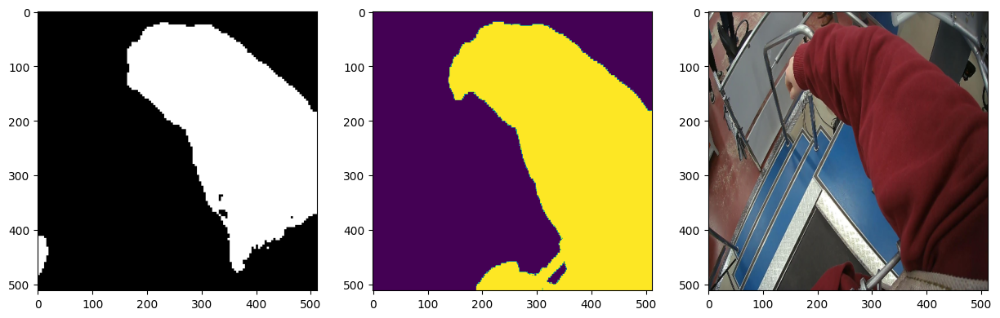

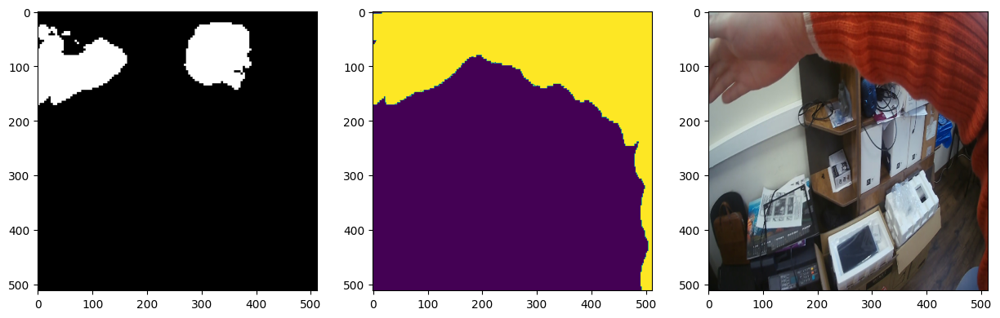

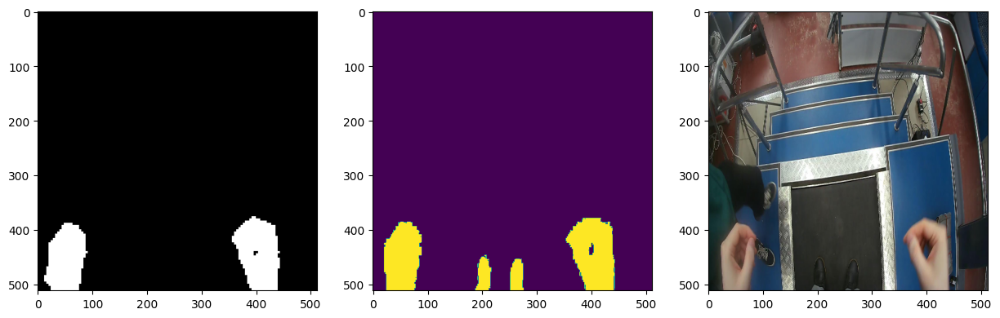

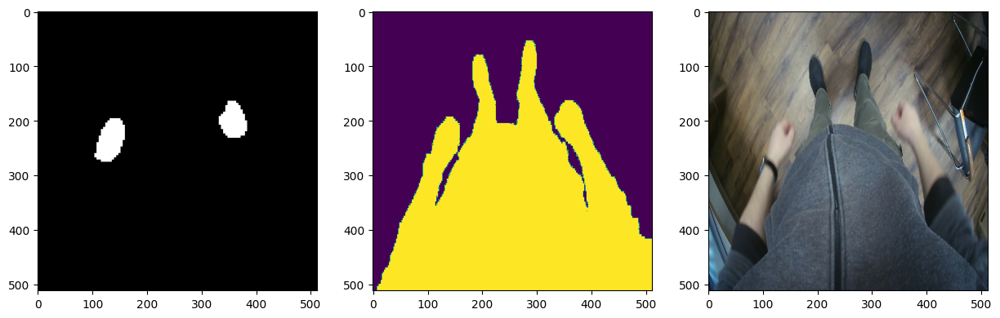

...

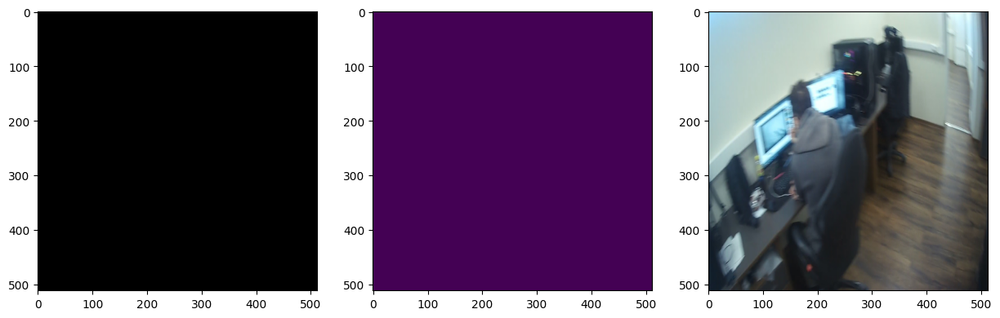

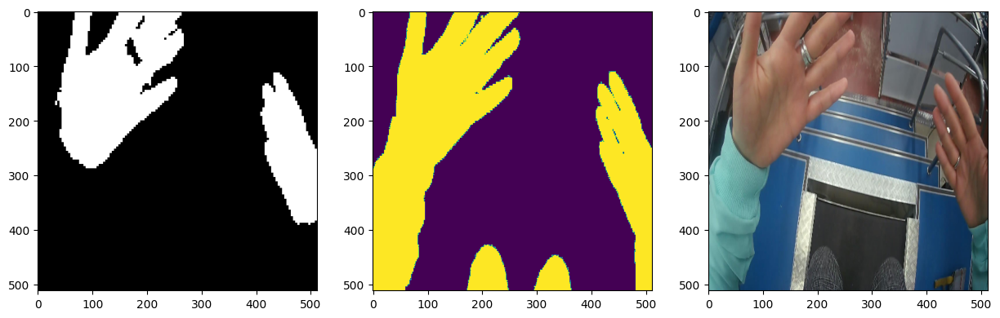

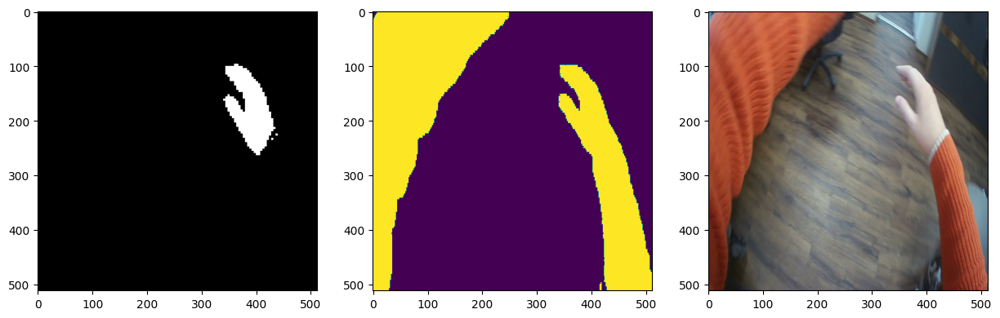

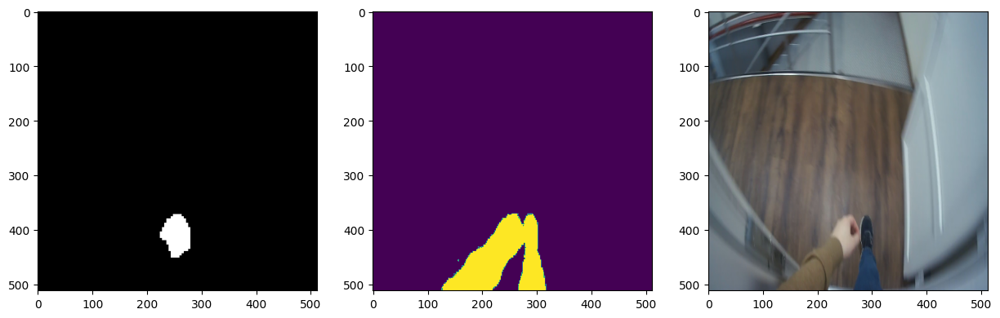

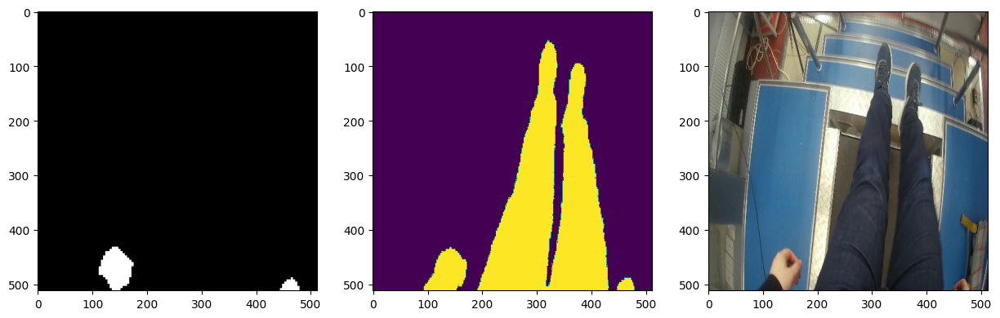

In [16]:
show_random_img("data", 10, p=0.99)

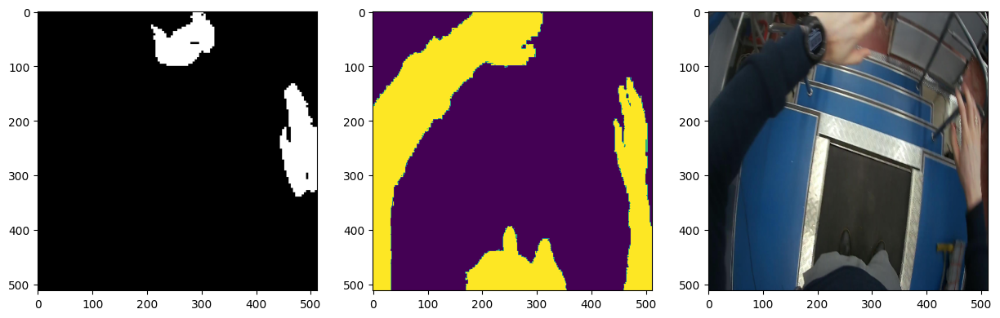

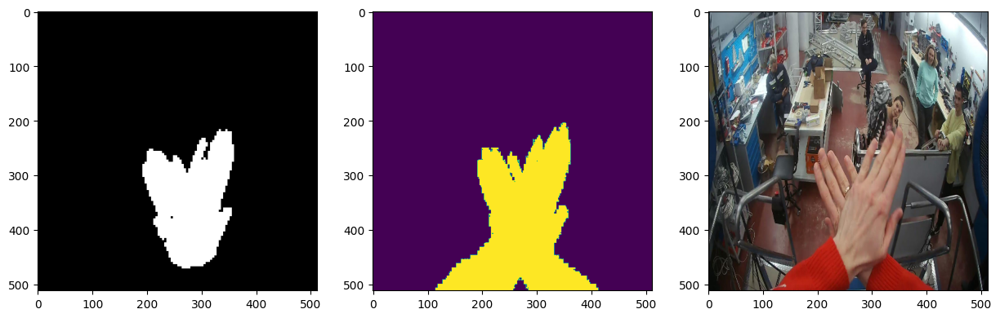

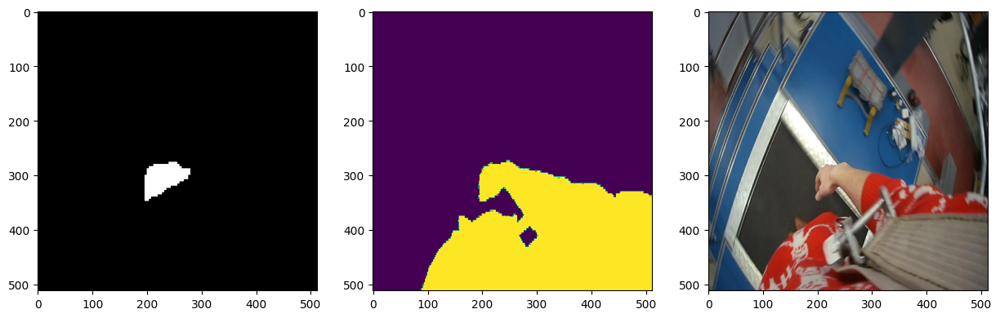

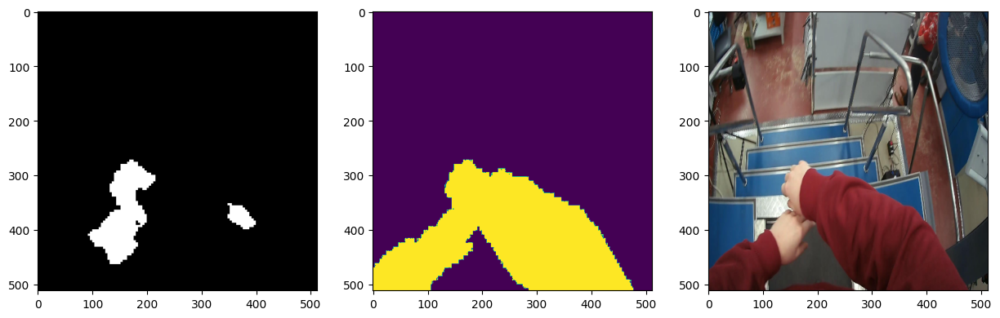

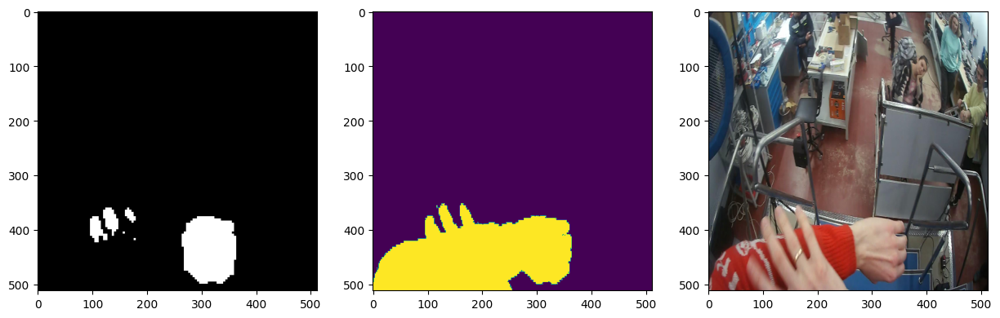

...

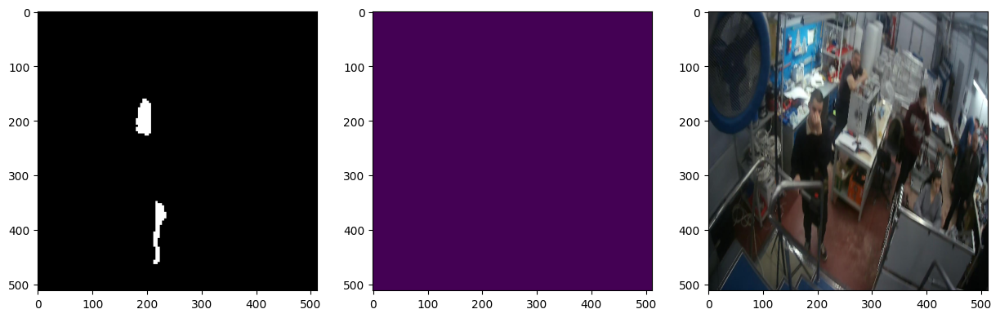

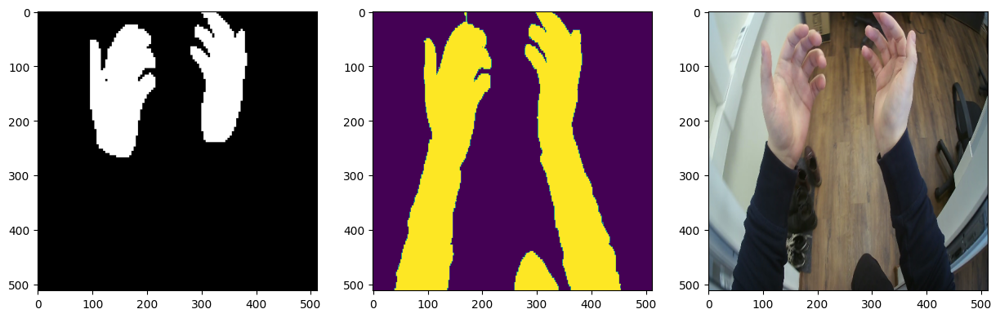

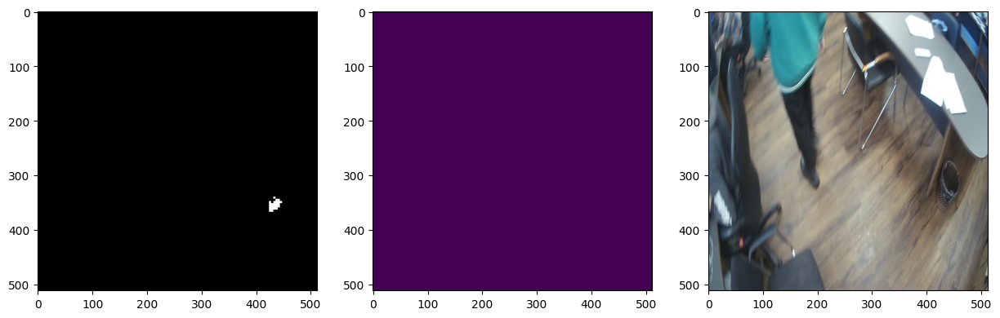

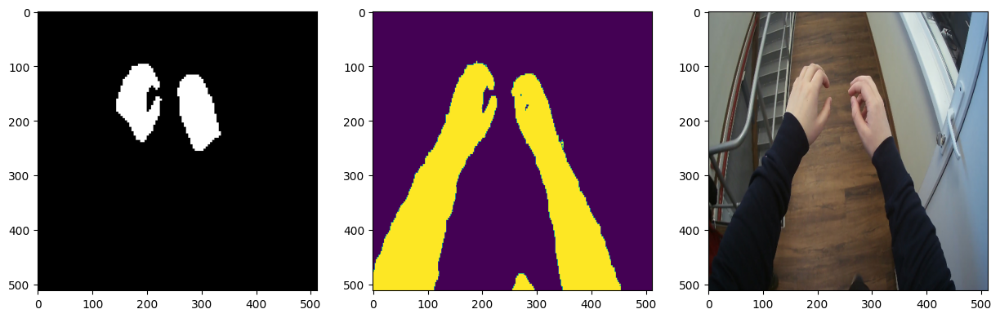

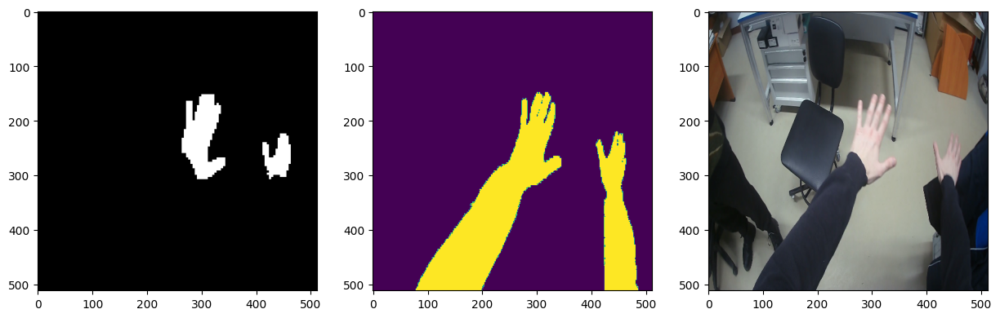

In [17]:
show_random_img("data", 10, p=0.99)

In [10]:
img_name = "data/RHD_published_v2/training/color/29129.png"
mask_name = img_name.replace("color", "mask")
img = cv2.imread(img_name)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
mask = cv2.imread(mask_name)

In [35]:
for i in range(len(mask)):
    for j in range(len(mask[0])):
        if mask[i][j].sum() > 3:
            mask[i][j][0] = 255
            mask[i][j][1] = 255
            mask[i][j][2] = 255
        else:
            mask[i][j][0] = 0
            mask[i][j][1] = 0
            mask[i][j][2] = 0

In [36]:
mask = torch.Tensor(mask[:, :, 0]).bool()
mask

tensor([[False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        ...,
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False]])

In [37]:
a = img_transform({'image': img, 'mask': mask})

In [38]:
a["mask"]

tensor([[False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        ...,
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False]])

In [39]:
a["mask"].numpy()

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

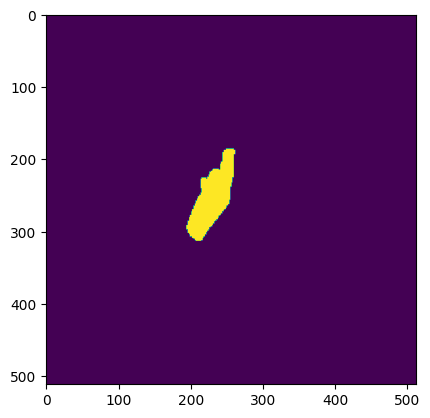

In [40]:
plt.imshow(a["mask"].numpy())
plt.show()